In [3]:
!pip install plotly

  Using cached plotly-5.21.0-py3-none-any.whl (15.7 MB)
  Using cached tenacity-8.2.3-py3-none-any.whl (24 kB)


In [4]:
import numpy as np
import pandas as pd

import plotly
import plotly.io as pio
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff

from plotly.subplots import make_subplots
from IPython.display import display, HTML, Image, Video

plotly.offline.init_notebook_mode()
display(HTML(
    '<script type="text/javascript" async src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.1/MathJax.js?config=TeX-MML-AM_SVG"></script>'
))
pio.templates.default = 'plotly_dark'

## Plotly

Plotly - это мощная библиотека для создания интерактивных графиков и визуализации данных, которая поддерживает множество языков программирования, включая Python, R, и JavaScript. Она предоставляет простой в использовании интерфейс для создания сложных графических представлений, которые могут быть встроены в веб-страницы или отображены в виде статических изображений. Plotly ценится за свою способность к созданию интерактивных графиков, которые позволяют пользователям углубляться в детали данных путем наведения курсора, увеличения масштаба и других действий с визуализацией. Это делает Plotly популярным инструментом для анализа данных и разработки дашбордов.


### Базовые диаграммы

#### Линейный график

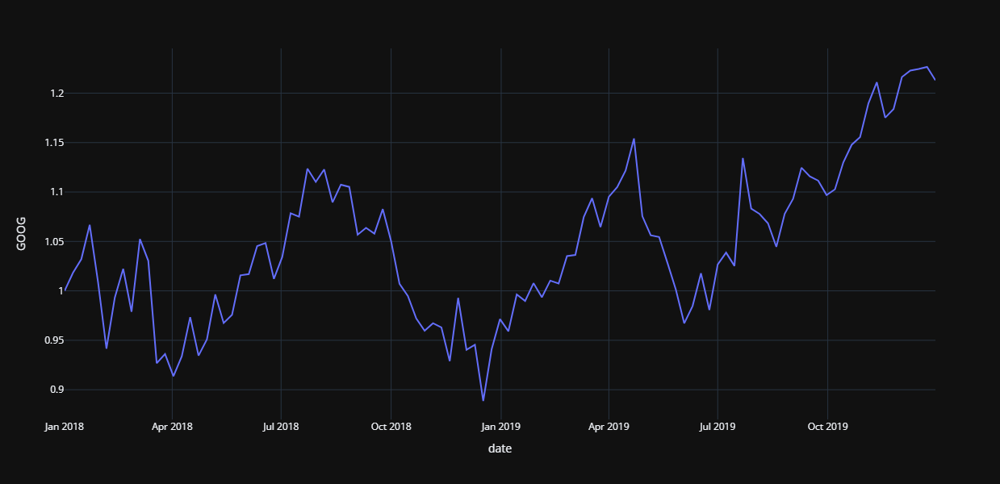

In [5]:
df = px.data.stocks()
fig = px.line(df, x='date', y="GOOG", width=800, height=600)
fig.show()

#### Пузырьковая диаграмма

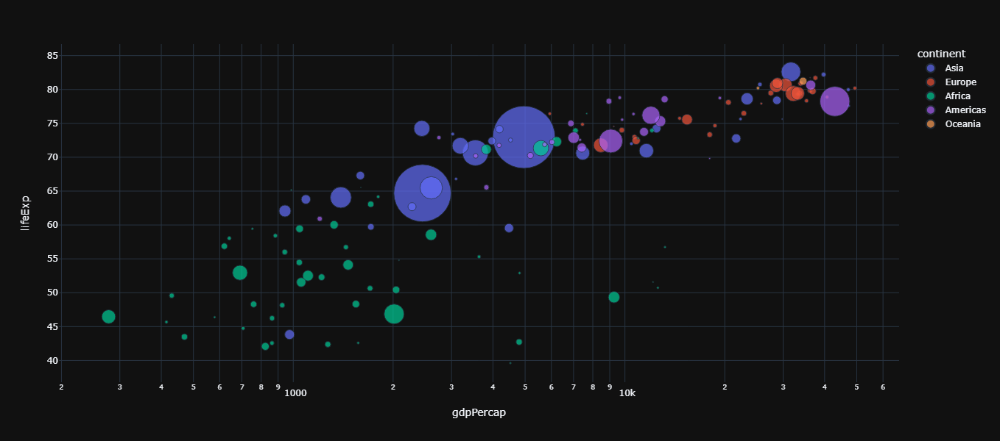

In [6]:
df = px.data.gapminder()

fig = px.scatter(df.query("year==2007"), x="gdpPercap", y="lifeExp",
	         size="pop", color="continent",
                 hover_name="country", log_x=True, size_max=60, width=800, height=600)
fig.show()

#### Круговая диаграмма

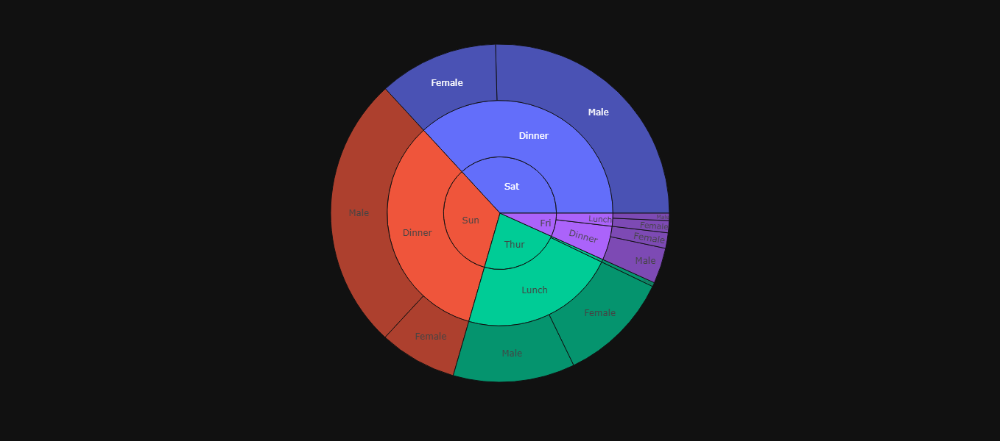

In [7]:
df = px.data.tips()
fig = px.sunburst(df, path=['day', 'time', 'sex'], values='total_bill', width=800, height=600)
fig.show()

### Статистические диаграммы

#### Гистограмма

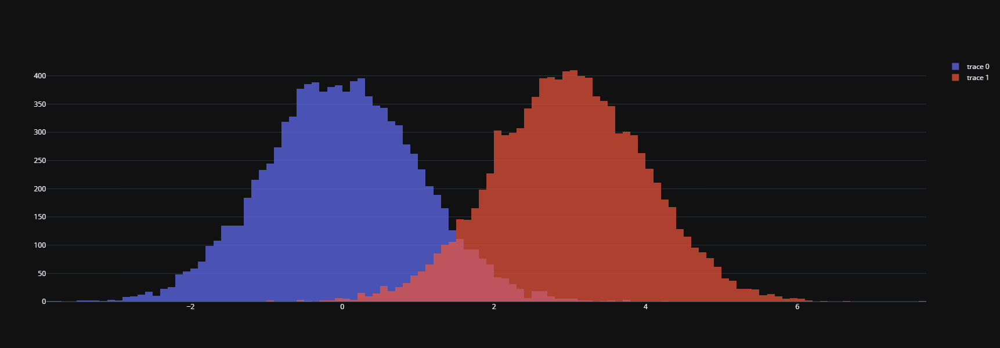

In [8]:
x0 = np.random.randn(10000)
# Add 1 to shift the mean of the Gaussian distribution
x1 = np.random.randn(10000) + 3

fig = go.Figure()
fig.add_trace(go.Histogram(x=x0, nbinsx=100))
fig.add_trace(go.Histogram(x=x1, nbinsx=100))

# Overlay both histograms
fig.update_layout(barmode='overlay', width=800, height=600)
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.7)
fig.show()

#### 2D Гистограмма

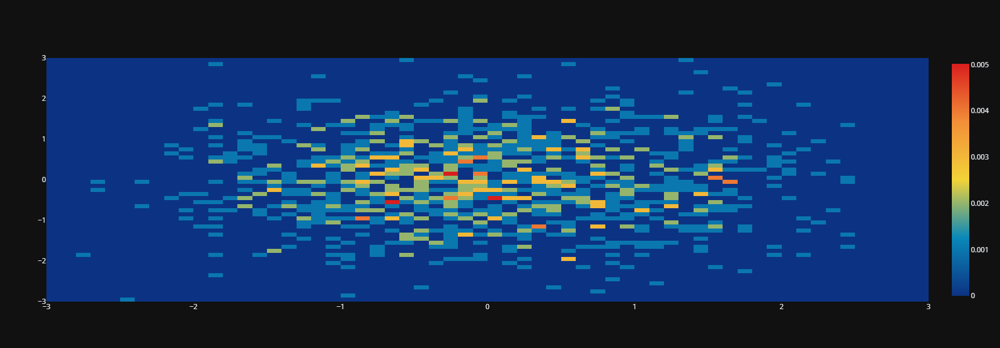

In [9]:
x = np.random.randn(1000)
y = np.random.randn(1000)

fig = go.Figure(go.Histogram2d(x=x, y=y, histnorm='probability',
        autobinx=False,
        xbins=dict(start=-3, end=3, size=0.1),
        autobiny=False,
        ybins=dict(start=-3, end=3, size=0.1),
        colorscale=[[0, 'rgb(12,51,131)'], [0.25, 'rgb(10,136,186)'], [0.5, 'rgb(242,211,56)'], [0.75, 'rgb(242,143,56)'], [1, 'rgb(217,30,30)']],
    ))
fig.update_layout(width=800, height=600)
fig.show()

#### Скрипичная диаграмма

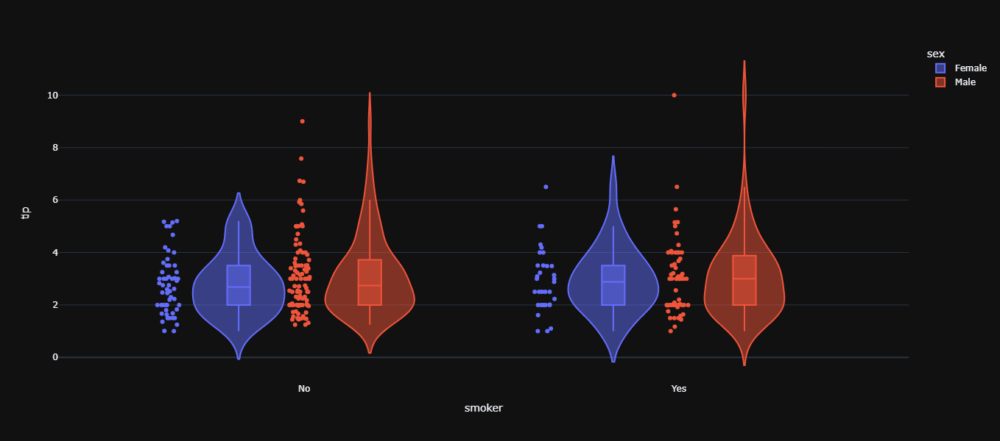

In [10]:
df = px.data.tips()
fig = px.violin(df, y="tip", x="smoker", color="sex", box=True, points="all",
          hover_data=df.columns)
fig.update_layout(width=800, height=600)
fig.show()

### Научные диаграммы

#### Сетевой график

In [11]:
import networkx as nx
G = nx.random_geometric_graph(200, 0.125)

edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = G.nodes[edge[0]]['pos']
    x1, y1 = G.nodes[edge[1]]['pos']
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

node_x = []
node_y = []
for node in G.nodes():
    x, y = G.nodes[node]['pos']
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        colorscale='YlGnBu',
        reversescale=True,
        color=[],
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

node_adjacencies = []
node_text = []
for node, adjacencies in enumerate(G.adjacency()):
    node_adjacencies.append(len(adjacencies[1]))
    node_text.append('# of connections: '+str(len(adjacencies[1])))

node_trace.marker.color = node_adjacencies
node_trace.text = node_text

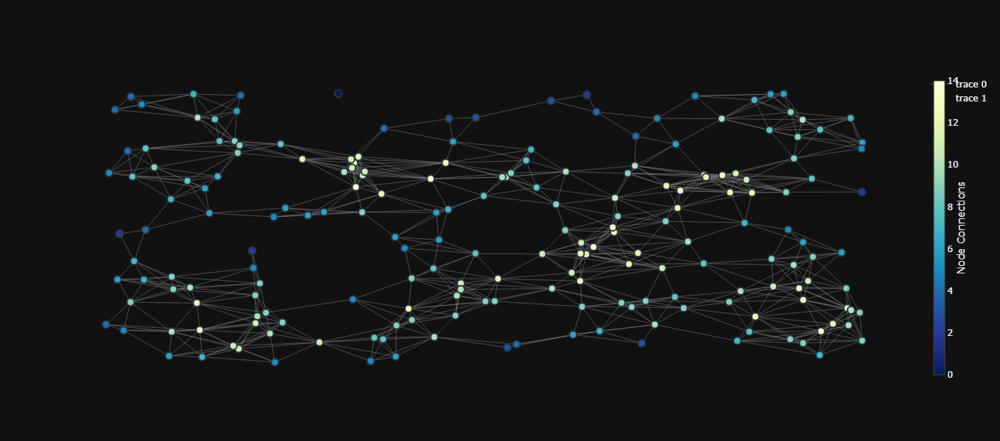

In [12]:
fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )
fig.update_layout(width=800, height=600)
fig.show()

#### График колчан

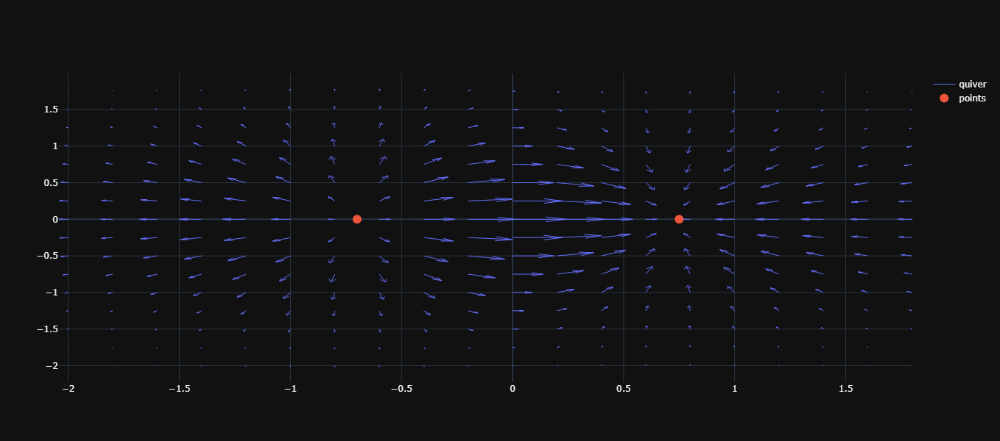

In [13]:
x,y = np.meshgrid(np.arange(-2, 2, .2),
                  np.arange(-2, 2, .25))
z = x*np.exp(-x**2 - y**2)
v, u = np.gradient(z, .2, .2)

# Create quiver figure
fig = ff.create_quiver(x, y, u, v,
                       scale=.25,
                       arrow_scale=.4,
                       name='quiver',
                       line_width=1)

# Add points to figure
fig.add_trace(go.Scatter(x=[-.7, .75], y=[0,0],
                    mode='markers',
                    marker_size=12,
                    name='points'))

fig.update_layout(width=800, height=600)
fig.show()

### Финансовые диаграммы

#### Свечной график

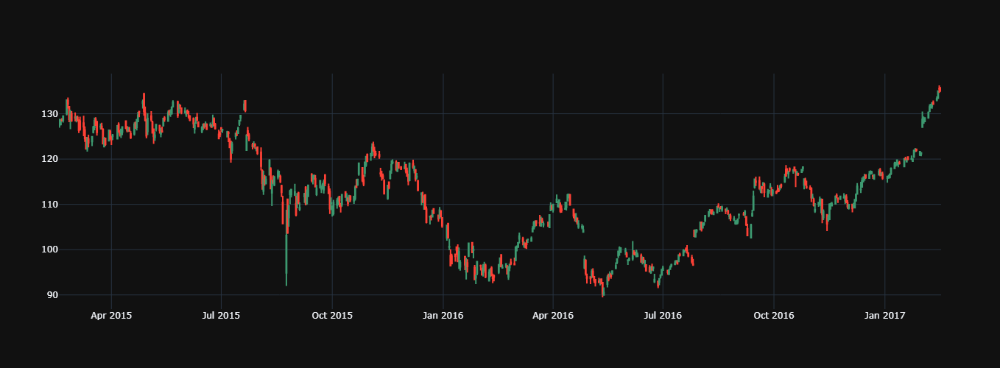

In [14]:
df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/finance-charts-apple.csv')

fig = go.Figure(data=[go.Candlestick(x=df['Date'],
                open=df['AAPL.Open'], high=df['AAPL.High'],
                low=df['AAPL.Low'], close=df['AAPL.Close'])
                     ])

fig.update_layout(xaxis_rangeslider_visible=False)
fig.update_layout(width=1200, height=500)
fig.show()

### Карты

#### Тепловая карта

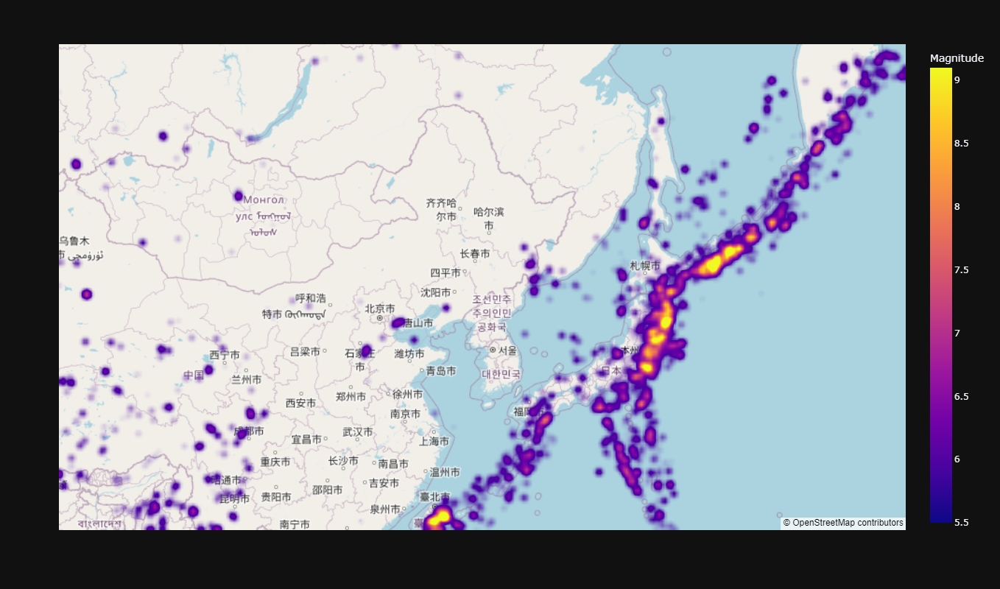

In [15]:
df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/earthquakes-23k.csv')

import plotly.express as px
fig = px.density_mapbox(df, lat='Latitude', lon='Longitude', z='Magnitude', radius=10,
                        center=dict(lat=0, lon=180), zoom=0,
                        mapbox_style="open-street-map")
fig.update_layout(width=1200, height=800)
fig.show()

### Трехмерные диаграммы

#### Управление 3D-камерой

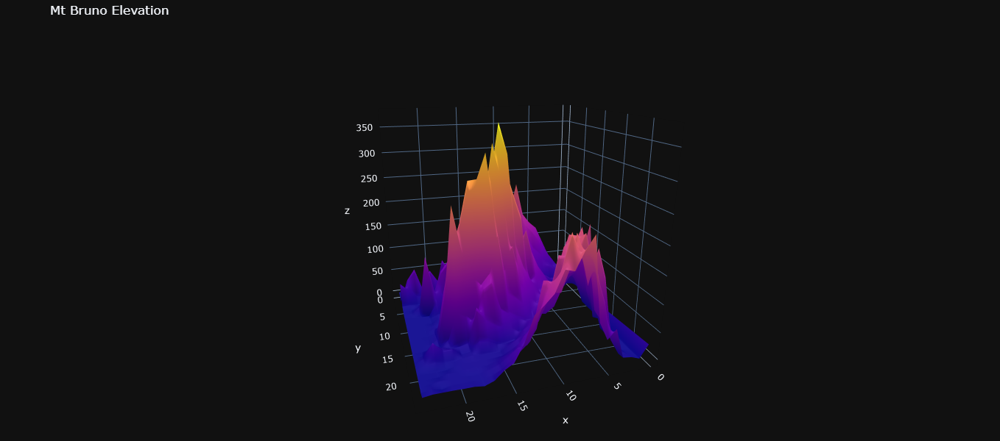

In [16]:
z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv')

fig = go.Figure(data=go.Surface(z=z_data, showscale=False))
fig.update_layout(
    title='Mt Bruno Elevation',
    width=400, height=400,
    margin=dict(t=40, r=0, l=20, b=20)
)

# Default parameters which are used when layout.sce≠.cameralayout.scene.camera is not provided
camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=0, y=0, z=0),
    eye=dict(x=1.25, y=1.25, z=1.25)
)

fig.update_layout(scene_camera=camera, width=600, height=600)
fig.show()

### Анимации

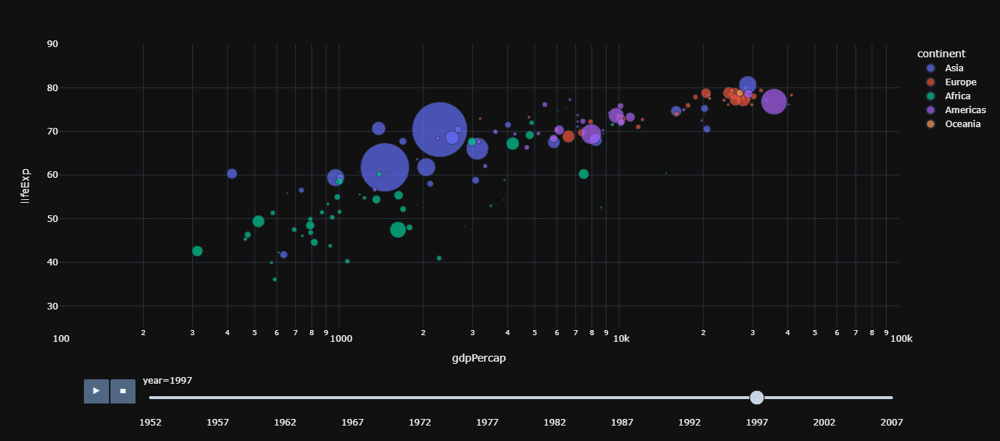

In [17]:
import plotly.express as px
df = px.data.gapminder()
px.scatter(df, x="gdpPercap", y="lifeExp", animation_frame="year", animation_group="country",
           size="pop", color="continent", hover_name="country", width=1200, height=600,
           log_x=True, size_max=55, range_x=[100,100000], range_y=[25,90])

## DataWrapper

Datawrapper — это инструмент, который позволяет создавать интерактивные диаграммы, карты и таблицы. При этом для его эффективного использования не нужно обладать знаниями в области дизайна. Разработчики этого инструмента учли множество правил дизайна, которыми имеет смысл следовать при визуализации данных. Кроме этого надо отметить, что всё то, что создаётся с помощью Datawrapper, подходит для просмотра на любых устройствах.

**Сильные стороны бесплатной версии**
* Поддерживается подключение изменяющихся CSV-файлов и файлов из системы Google Таблицы.
* Бесплатный тарифный план позволяет создавать и публиковать неограниченное количество диаграмм, карт и таблиц.

**Слабые стороны бесплатной версии**
* Бесплатная версия позволяет экспортировать диаграммы только в PNG-файлы.
* Тому, кто решит перейти на платную версию системы, придётся заплатить 599$ за месяц подписки.

In [18]:
html_str = """
<div style="text-align:center;">
    <img src="DataWrapper.gif" width="45%" />
</div>
"""
display(HTML(html_str))

### Примеры

#### Графики

In [19]:
html_str = f"""
<div style="display:flex; justify-content: space-around;">
    <img src="before.png" style="width:40%;"/>
    <img src="after.png" style="width:40%;"/>
</div>
"""
display(HTML(html_str))

In [20]:
html_str = f"""
<div style="display:flex; justify-content: space-around;">
    <img src="before_2.png" style="width:40%;"  />
    <img src="after_2.png" style="width:40%;"  />
</div>
"""
display(HTML(html_str))


#### Карты

In [21]:
html_str = f"""
<div style="display:flex; justify-content: space-around;">
    <img src="map.png" style="width:60%; height:60%;"  />
</div>
"""
display(HTML(html_str))

#### Таблицы

In [22]:
html_str = f"""
<div style="display:flex; justify-content: space-around;">
    <img src="car.png" style="width:80%"  />
</div>
"""
display(HTML(html_str))

## Выводы:
Plotly и Datawrapper — это два популярных инструмента для визуализации данных. Однако у них есть свои преимущества и недостатки:
1. Plotly:
* Преимущества:
    * Гибкость: Plotly предоставляет широкий спектр типов графиков и настроек, что позволяет создавать сложные и настраиваемые визуализации.
    * Интерактивность: Графики, созданные с помощью Plotly, часто интерактивны, что позволяет пользователям взаимодействовать с визуализацией (например, масштабирование, перемещение).
    * Интеграция с Python: Plotly хорошо интегрируется с Python, что делает его удобным выбором для аналитиков и исследователей, работающих в этой среде.
    * Поддержка различных языков программирования: Plotly также поддерживает другие языки, такие как R, MATLAB.
* Недостатки:
    * Сложность: Для новых пользователей может быть сложно освоить все возможности Plotly.
    * Производительность: Сложные интерактивные графики могут быть ресурсоемкими и медленными при загрузке.

2. Datawrapper:
* Преимущества:
    * Простота использования: Datawrapper имеет удобный интерфейс и прост для создания графиков, что делает его доступным даже для неспециалистов.
    * Не требует программирования: Для создания визуализаций не требуется знание языков программирования.
    * Оптимизирован для медиа: Datawrapper широко используется журналистами и медиа-организациями для быстрого создания чистых и читаемых визуализаций.
    * Отзывчивый дизайн: Графики, созданные в Datawrapper, автоматически адаптируются под разные размеры экранов.
* Недостатки:
    * Ограниченная настраиваемость: В отличие от Plotly, возможности настройки в Datawrapper сильно ограничены, особенно в бесплатной версии.
    * Ограниченные типы графиков: Набор доступных типов графиков в Datawrapper не так широк, как в Plotly.
    * Зависимость от платформы: Datawrapper — это веб-сервис, и пользователи зависят от его доступности и производительности серверов.